# Lead-Lag Analysis
In this notebook, we find the ideal window length $\hat{n}$ of rolling average of the alternative data and the ideal lead-lag value $\hat{\ell}$ that produces the strongest correlations between the alternative datasets and Datadog's quarterly metrics.

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import scipy.stats as stats
import numba
from pathlib import Path
from typing import Tuple, List, Dict

# Set directory paths
NOTEBOOK_DIR = Path(os.path.abspath('')).resolve()
CODE_DIR = NOTEBOOK_DIR.parent
DATA_DIR = CODE_DIR.parent / 'Data'
RESULTS_DIR = CODE_DIR.parent / 'Results'
SUMMARIES_DIR = RESULTS_DIR / 'Summaries'
SUMMARIES_DIR.mkdir(parents=True, exist_ok=True)

In [21]:
# Define information of each quarterly metric for plotting
metric_configs = [
    {
        'col': 'revenue (USD)',
        'title': '1. Revenue (USD)',
        'color': '#08519c',
        'type': 'currency_b',
    },
    {
        'col': 'revenue_qoq (%)',
        'title': '2. Revenue QoQ Growth Rate (%)',
        'color': '#3182bd',
        'type': 'pct',
    },
    {
        'col': 'revenue_yoy (%)',
        'title': '3. Revenue YoY Growth Rate (%)',
        'color': '#6baed6',
        'type': 'pct',
    },
    {
        'col': 'rpo (USD)',
        'title': '4. Remaining Performance Obligations (RPO) (USD)',
        'color': '#a63603',
        'type': 'currency_b',
    },
    {
        'col': 'rpo_qoq (%)',
        'title': '5. RPO QoQ Growth Rate (%)',
        'color': '#e6550d',
        'type': 'pct',
    },
    {
        'col': 'rpo_yoy (%)',
        'title': '6. RPO YoY Growth Rate (%)',
        'color': '#fd8d3c',
        'type': 'pct',
    },
    {
        'col': 'billings (USD)',
        'title': '7. Calculated Billings (USD)',
        'color': '#006d2c',
        'type': 'currency_b',
    },
    {
        'col': 'billings_qoq (%)',
        'title': '8. Billings QoQ Growth Rate (%)',
        'color': '#31a354',
        'type': 'pct',
    },
    {
        'col': 'billings_yoy (%)',
        'title': '9. Billings YoY Growth Rate (%)',
        'color': '#74c476',
        'type': 'pct',
    },
    {
        'col': 'large_customer_count',
        'title': '10. Number of Large Customers (ARR >= $100k)',
        'color': '#54278f',
        'type': 'count',
    },
    {
        'col': 'large_customer_qoq (%)',
        'title': '11. Large Customer QoQ Growth Rate (%)',
        'color': '#756bb1',
        'type': 'pct',
    },
    {
        'col': 'large_customer_yoy (%)',
        'title': '12. Large Customer YoY Growth Rate (%)',
        'color': '#9e9ac8',
        'type': 'pct',
    },
    {
        'col': 'net_revenue_retention (%)',
        'title': '13. Net Revenue Retention (%)',
        'color': '#cb181d',
        'type': 'pct',
    },
]

In [22]:
# Scope of analysis. Unit in days.
max_wlen = 90 # grid of window lengths of rolling average (1 to 90 days)
wgrid_days = np.arange(1, max_wlen + 1)
max_lag = 90 # grid of lags (-90 to +90 days)
lgrid_days = np.linspace(-max_lag, max_lag, 2 * max_lag + 1)
lags_s = lgrid_days * 86400.0


## Create DataFrame from CSVs

In [23]:
csv_path = DATA_DIR / 'qtrly_metrics.csv'
if not csv_path.exists():
    csv_path = Path('../Data/qtrly_metrics.csv')

df_metrics = pd.read_csv(csv_path)
df_metrics['timestamp_utc'] = pd.to_datetime(df_metrics['timestamp_utc'])
df_metrics = df_metrics.set_index('timestamp_utc').sort_index()
print(f"Loaded {len(df_metrics)} rows from qtrly_metrics.csv.")

Loaded 30 rows from qtrly_metrics.csv.


In [24]:
# NASDAQ:PYPL prices and returns
s_pypl_returns = pd.read_csv(
    DATA_DIR / 'pypl_returns.csv', 
    parse_dates=['timestamp_utc']
).set_index('timestamp_utc')['return'].dropna().sort_index()

# Cloud tech-related news headlines 
s_tech_headlines = pd.read_csv(
    DATA_DIR / 'tech_headlines.csv', 
    parse_dates=['timestamp_utc']
).set_index('timestamp_utc')['news_score'].dropna().sort_index()

# Datadog product releases
s_announcements = pd.read_csv(
    DATA_DIR / 'announcements.csv', 
    parse_dates=['timestamp_utc']
)
s_announcements = s_announcements[s_announcements['product_release'] == True].set_index('timestamp_utc')['product_release'].sort_index()

print("Created all pandas.Series for data analysis.")


Created all pandas.Series for data analysis.


## Functions

In [25]:
def extract_time_and_values(
    series: pd.Series
) -> Tuple[np.ndarray, np.ndarray]:
    """Extract timestamps in seconds and numerical values from a pandas Series."""
    t = (series.index.astype(np.int64) // 10**9).to_numpy(dtype=np.float64)
    v = series.to_numpy(dtype=np.float64)
    return t, v

def align_timestamps(
    s1: pd.Series,
    s2: pd.Series,
    s1_lag_days: float = 0
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Time-shifts s1 by `s1_lag_days` days and aligns observations with s2.
    Returns (data1, data2, diffs_in_days).
    """
    if s1_lag_days is None:
        s1_lag_days = 0

    t1, raw_data1 = extract_time_and_values(s1)
    t2, raw_data2 = extract_time_and_values(s2)

    # Shift s1 timestamps into the future (86400 seconds = 1 day)
    t1 = t1 + 86400 * s1_lag_days

    # Overlapping window
    start_time = max(t1[0], t2[0])
    end_time = min(t1[-1], t2[-1])

    valid_mask2 = (t2 >= start_time) & (t2 <= end_time)
    valid_t2 = t2[valid_mask2]
    data2 = raw_data2[valid_mask2]

    # Find the latest observation in shifted t1 at or prior to each valid t2
    matched_idx = np.searchsorted(t1, valid_t2, side='right') - 1

    valid_t1 = t1[matched_idx]
    data1 = raw_data1[matched_idx]
    diffs = (valid_t2 - valid_t1) / 86400

    return data1, data2, diffs

def hy_estimator(
    s_x: pd.Series,
    s_y: pd.Series,
    lag_s: float
) -> float:
    """
    Hayashi-Yoshida cross-correlation estimator with lag in seconds.
    s_x is the series being time-shifted. Positive hy_estimator means that s_x is leading s_y, negative 
    means that s_x lags behind s_y.
    """
    t_x, v_x = extract_time_and_values(s_x)
    t_y, v_y = extract_time_and_values(s_y)
    t_x = t_x + lag_s
    
    n_x, n_y = len(t_x), len(t_y)
    if n_x < 2 or n_y < 2:
        return np.nan
        
    v_x_c = v_x - np.mean(v_x)
    v_y_c = v_y - np.mean(v_y)
    
    dx = np.diff(v_x_c)
    dy = np.diff(v_y_c)
    
    s_x_arr = t_x[:-1, None]
    e_x_arr = t_x[1:, None]
    s_y_arr = t_y[None, :-1]
    e_y_arr = t_y[None, 1:]
    
    overlap = (np.maximum(s_x_arr, s_y_arr) < np.minimum(e_x_arr, e_y_arr))
    
    cov = np.sum(overlap * (dx[:, None] * dy[None, :]))
    denom = np.sqrt(np.sum(dx**2) * np.sum(dy**2))
    return cov / denom if denom > 0 else np.nan

@numba.njit(fastmath=True, parallel=True)
def hy_grid_numba(
    t_x: np.ndarray,
    dx: np.ndarray,
    t_y: np.ndarray,
    dy_all: np.ndarray,
    lags_s: np.ndarray
) -> np.ndarray:
    """Fast parallel Hayashi-Yoshida cross-correlation calculation over a 2D grid."""
    W = dy_all.shape[0]
    L = len(lags_s)
    Nx = len(t_x)
    Ny = len(t_y)
    
    sum_dx2 = np.sum(dx**2)
    sum_dy2_all = np.empty(W, dtype=np.float64)
    for w in range(W):
        sum_dy2_all[w] = np.sum(dy_all[w]**2)
        
    out = np.empty((W, L), dtype=np.float64)
    
    for l_idx in numba.prange(L):
        lag = lags_s[l_idx]
        for w in range(W):
            denom = np.sqrt(sum_dx2 * sum_dy2_all[w])
            if denom == 0:
                out[w, l_idx] = np.nan
                continue
            cov = 0.0
            for i in range(Nx - 1):
                sx = t_x[i] + lag
                ex = t_x[i+1] + lag
                dxi = dx[i]
                for j in range(Ny - 1):
                    sy = t_y[j]
                    ey = t_y[j+1]
                    if max(sx, sy) < min(ex, ey):
                        cov += dxi * dy_all[w, j]
            out[w, l_idx] = cov / denom
    return out

@numba.njit(fastmath=True, parallel=True)
def pearsons_grid_numba(
    t1: np.ndarray,
    v1_all: np.ndarray,
    t2: np.ndarray,
    v2: np.ndarray,
    lags_s: np.ndarray
) -> np.ndarray:
    """Fast parallel Pearson correlation calculation over a 2D grid."""
    W = v1_all.shape[0]
    L = len(lags_s)
    Nx = len(t2)
    Ny = len(t1)
    
    r_matrix = np.full((W, L), np.nan, dtype=np.float64)
    
    for l_idx in numba.prange(L):
        lag = lags_s[l_idx]
        t2_shifted = t2 - lag
        
        for w in range(W):
            sum_x = 0.0
            sum_y = 0.0
            sum_x2 = 0.0
            sum_y2 = 0.0
            sum_xy = 0.0
            k = 0
            
            for i in range(Nx):
                ts = t2_shifted[i]
                if ts >= t1[0] and ts <= t1[-1]:
                    idx = np.searchsorted(t1, ts, side='right') - 1
                    if idx >= 0:
                        x = v1_all[w, idx]
                        y = v2[i]
                        sum_x += x
                        sum_y += y
                        sum_x2 += x * x
                        sum_y2 += y * y
                        sum_xy += x * y
                        k += 1
            
            if k >= 3:
                mean_x = sum_x / k
                mean_y = sum_y / k
                var_x = sum_x2 - k * mean_x * mean_x
                var_y = sum_y2 - k * mean_y * mean_y
                denom = np.sqrt(max(0.0, var_x * var_y))
                if denom > 1e-12:
                    cov = sum_xy - k * mean_x * mean_y
                    r = cov / denom
                    r = max(-1.0, min(1.0, r))
                    r_matrix[w, l_idx] = r
    return r_matrix

def pearsons_corr_lag(
    s_x: pd.Series,
    s_y: pd.Series,
    lag_days: float
) -> Tuple[float, float]:
    """
    Compute Pearson correlation coefficient and p-value between time-shifted s_x and s_y.
    """
    x, y, _ = align_timestamps(s_x, s_y, lag_days)
    if len(x) < 3:
        return np.nan, np.nan
    r, p_val = stats.pearsonr(x, y)
    return r, p_val


## Using HY Estimator
Hayashi-Yoshida (HY) estimator $\rho(n, \ell)$ is evaluated across a 2D grid of rolling average window lengths $n \in [1, 90]$ days and artificial time shifts $\ell \in [-90, +90]$ days. 

The ideal rolling window length $\hat{n}$ and ideal lead-lag value $\hat{\ell}$ are obtained by applying contrast maximization on the HY estimator:
$$\hat{n}, \hat{\ell} = \arg\max_{n, \ell} |\rho(n, \ell)|$$

Positive $\hat{\ell}$ means alternative dataset leads metric; negative means metric leads alternative dataset. 
Positive $\hat{\rho}$ means the two microstructure measures move in the same direction; negative means opposite direction.


### Source 1: PYPL returns

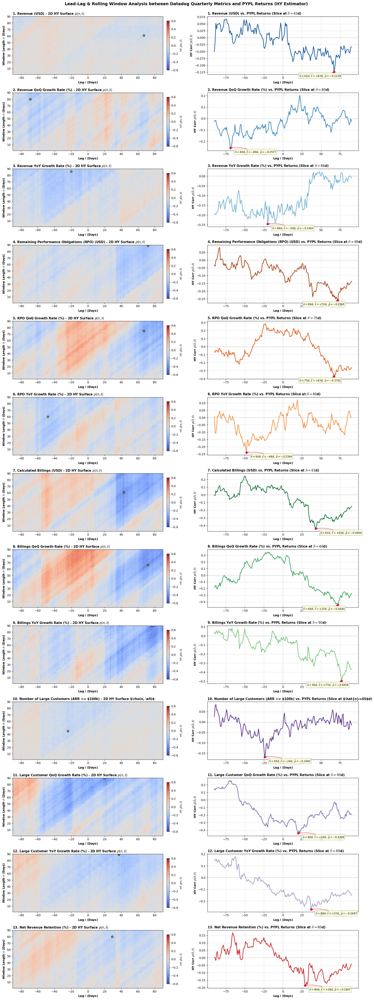

In [26]:
# Create 2D array of alternative data for each n and l, dy_all. 
# Each row contains data for a given n, each column represents the next alternative datapoint
# along the timeline.
t_y, _ = extract_time_and_values(s_pypl_returns)
dy_all = np.empty((len(wgrid_days), len(t_y) - 1), dtype=np.float64)
for i, w in enumerate(wgrid_days):
    s_w = s_pypl_returns.rolling(f'{w}D', min_periods=1).mean()
    _, v_w = extract_time_and_values(s_w)
    dy_all[i, :] = np.diff(v_w - np.mean(v_w))

fig, axes = plt.subplots(len(metric_configs), 2, figsize=(18, 48), gridspec_kw={'width_ratios': [1.2, 1]})

hy_results_pypl_returns = []

for idx, cfg in enumerate(metric_configs):
    ax_map = axes[idx, 0]
    ax_line = axes[idx, 1]
    col = cfg['col']
    title = cfg['title']
    color = cfg['color']
    
    series = df_metrics[col].dropna()
    t_x, v_x = extract_time_and_values(series)
    dx = np.diff(v_x - np.mean(v_x))
    
    # 2D Grid search using HY estimator
    corr_matrix = hy_grid_numba(t_x, dx, t_y, dy_all, lags_s)
    abs_corr = np.abs(corr_matrix)
    best_idx = np.unravel_index(np.nanargmax(abs_corr), corr_matrix.shape)
    w_hat = int(wgrid_days[best_idx[0]])
    l_hat = int(lgrid_days[best_idx[1]])
    rho_hat = corr_matrix[best_idx]
    
    hy_results_pypl_returns.append({
        'col': col,
        'title': title,
        'color': color,
        'n_hat': w_hat,
        'l_hat': l_hat,
        'rho_hat': rho_hat,
        'corr_matrix': corr_matrix
    })
    
    # Left subplot: 2D Heatmap of HY Correlation surface rho(n, l)
    extent = [lgrid_days[0], lgrid_days[-1], wgrid_days[0], wgrid_days[-1]]
    im = ax_map.imshow(
        corr_matrix,
        extent=extent,
        origin='lower',
        aspect='auto',
        cmap='coolwarm',
        vmin=-0.6,
        vmax=0.6
    )
    ax_map.scatter(l_hat, w_hat, color='yellow', edgecolor='black', s=80, marker='*', zorder=5)
    ax_map.axhline(w_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.axvline(l_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.set_title(f"{title} - 2D HY Surface $\\rho(n, \\ell)$", fontsize=11, fontweight='bold', loc='left')
    ax_map.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_map.set_ylabel(r'Window Length $n$ (Days)', fontsize=10, fontweight='bold')
    cbar = fig.colorbar(im, ax=ax_map, pad=0.02, shrink=0.85)
    cbar.set_label(r'HY $\rho(n, \ell)$', fontsize=9)
    
    # Right subplot: 1D Slice at optimal window length n_hat
    slice_corrs = corr_matrix[best_idx[0], :]
    ax_line.plot(lgrid_days, slice_corrs, color=color, linewidth=2.0, label=f'HY Corr (at $\\hat{{n}}={w_hat}$d)')
    ax_line.axhline(0, color='gray', linestyle='--', linewidth=0.8, alpha=0.6)
    ax_line.axvline(0, color='gray', linestyle=':', linewidth=0.8, alpha=0.6)
    ax_line.scatter(l_hat, rho_hat, color='crimson', s=50, zorder=5)
    
    x_offset = 15 if l_hat <= 45 else -120
    y_offset = -22 if (l_hat < -30 and rho_hat >= 0) else (12 if rho_hat >= 0 else -18)
    ax_line.annotate(
        rf'$\hat{{n}}={w_hat}\mathrm{{d}},\;\hat{{\ell}}={l_hat:+.0f}\mathrm{{d}},\;\hat{{\rho}}={rho_hat:+.4f}$',
        xy=(l_hat, rho_hat),
        xytext=(x_offset, y_offset),
        textcoords='offset points',
        fontsize=9,
        fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='#ffffdd', alpha=0.85, edgecolor='gray', lw=0.7),
        arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.15', color='crimson', lw=1.0)
    )
    ax_line.set_title(f"{title} vs. PYPL Returns (Slice at $\\hat{{n}}={w_hat}$d)", fontsize=11, fontweight='bold', loc='left')
    ax_line.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_line.set_ylabel(r'HY Corr $\rho(\hat{n}, \ell)$', fontsize=10, fontweight='bold')
    ax_line.grid(True, linestyle='--', alpha=0.5)

plt.suptitle("Lead-Lag & Rolling Window Analysis between Datadog Quarterly Metrics and PYPL Returns (HY Estimator)", fontsize=14, fontweight='bold', y=0.999)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'lead_lag_analysis_hy_pypl_returns.png', dpi=150, bbox_inches='tight')
plt.show()

### Source 2: Tech headlines


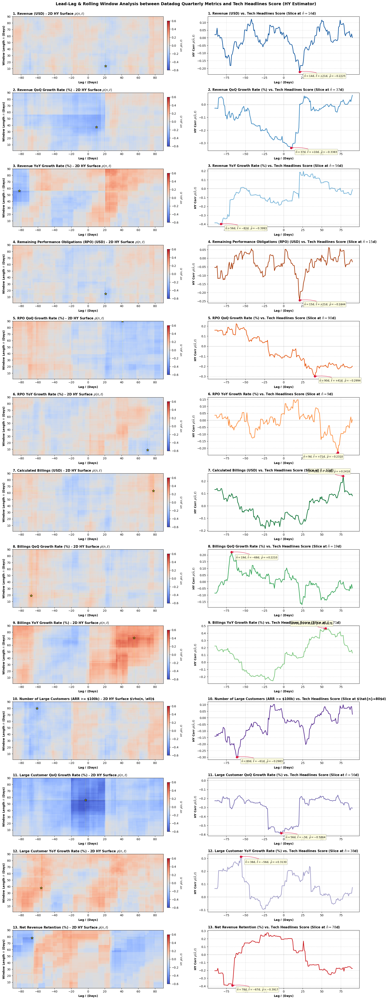

In [27]:
# Create 2D array of alternative data for each n and l, dy_all. 
# Each row contains data for a given n, each column represents the next alternative datapoint
# along the timeline.
rolling_tech_headlines = [s_tech_headlines.rolling(f'{w}D', min_periods=1).mean() for w in wgrid_days]
t_y_tech, _ = extract_time_and_values(rolling_tech_headlines[0])
dy_all_tech = np.empty((len(wgrid_days), len(t_y_tech) - 1), dtype=np.float64)
for i, s_w in enumerate(rolling_tech_headlines):
    _, v_w = extract_time_and_values(s_w)
    dy_all_tech[i, :] = np.diff(v_w - np.mean(v_w))

fig, axes = plt.subplots(len(metric_configs), 2, figsize=(18, 48), gridspec_kw={'width_ratios': [1.2, 1]})

hy_results_tech_headlines = []

for idx, cfg in enumerate(metric_configs):
    ax_map = axes[idx, 0]
    ax_line = axes[idx, 1]
    col = cfg['col']
    title = cfg['title']
    color = cfg['color']
    
    series = df_metrics[col].dropna()
    t_x, v_x = extract_time_and_values(series)
    dx = np.diff(v_x - np.mean(v_x))
    
    corr_matrix = hy_grid_numba(t_x, dx, t_y_tech, dy_all_tech, lags_s)
    abs_corr = np.abs(corr_matrix)
    best_idx = np.unravel_index(np.nanargmax(abs_corr), corr_matrix.shape)
    w_hat = int(wgrid_days[best_idx[0]])
    l_hat = int(lgrid_days[best_idx[1]])
    rho_hat = corr_matrix[best_idx]
    
    hy_results_tech_headlines.append({
        'col': col,
        'title': title,
        'color': color,
        'n_hat': w_hat,
        'l_hat': l_hat,
        'rho_hat': rho_hat,
        'corr_matrix': corr_matrix
    })
    
    # 2D Heatmap
    extent = [lgrid_days[0], lgrid_days[-1], wgrid_days[0], wgrid_days[-1]]
    im = ax_map.imshow(
        corr_matrix,
        extent=extent,
        origin='lower',
        aspect='auto',
        cmap='coolwarm',
        vmin=-0.6,
        vmax=0.6
    )
    ax_map.scatter(l_hat, w_hat, color='yellow', edgecolor='black', s=80, marker='*', zorder=5)
    ax_map.axhline(w_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.axvline(l_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.set_title(f"{title} - 2D HY Surface $\\rho(n, \\ell)$", fontsize=11, fontweight='bold', loc='left')
    ax_map.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_map.set_ylabel(r'Window Length $n$ (Days)', fontsize=10, fontweight='bold')
    cbar = fig.colorbar(im, ax=ax_map, pad=0.02, shrink=0.85)
    cbar.set_label(r'HY $\rho(n, \ell)$', fontsize=9)
    
    # 1D Slice at optimal window length n_hat
    slice_corrs = corr_matrix[best_idx[0], :]
    ax_line.plot(lgrid_days, slice_corrs, color=color, linewidth=2.0, label=f'HY Corr (at $\\hat{{n}}={w_hat}$d)')
    ax_line.axhline(0, color='gray', linestyle='--', linewidth=0.8, alpha=0.6)
    ax_line.axvline(0, color='gray', linestyle=':', linewidth=0.8, alpha=0.6)
    ax_line.scatter(l_hat, rho_hat, color='crimson', s=50, zorder=5)
    
    x_offset = 15 if l_hat <= 45 else -120
    y_offset = -22 if (l_hat < -30 and rho_hat >= 0) else (12 if rho_hat >= 0 else -18)
    ax_line.annotate(
        rf'$\hat{{n}}={w_hat}\mathrm{{d}},\;\hat{{\ell}}={l_hat:+.0f}\mathrm{{d}},\;\hat{{\rho}}={rho_hat:+.4f}$',
        xy=(l_hat, rho_hat),
        xytext=(x_offset, y_offset),
        textcoords='offset points',
        fontsize=9,
        fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='#ffffdd', alpha=0.85, edgecolor='gray', lw=0.7),
        arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.15', color='crimson', lw=1.0)
    )
    ax_line.set_title(f"{title} vs. Tech Headlines Score (Slice at $\\hat{{n}}={w_hat}$d)", fontsize=11, fontweight='bold', loc='left')
    ax_line.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_line.set_ylabel(r'HY Corr $\rho(\hat{n}, \ell)$', fontsize=10, fontweight='bold')
    ax_line.grid(True, linestyle='--', alpha=0.5)

plt.suptitle("Lead-Lag & Rolling Window Analysis between Datadog Quarterly Metrics and Tech Headlines Score (HY Estimator)", fontsize=14, fontweight='bold', y=0.999)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'lead_lag_analysis_hy_tech_headlines.png', dpi=150, bbox_inches='tight')
plt.show()


### Source 3: Datadog product releases
Grid search across rolling frequency window lengths $n \in [1, 90]$ days and time shifts $\ell \in [-90, +90]$ days.


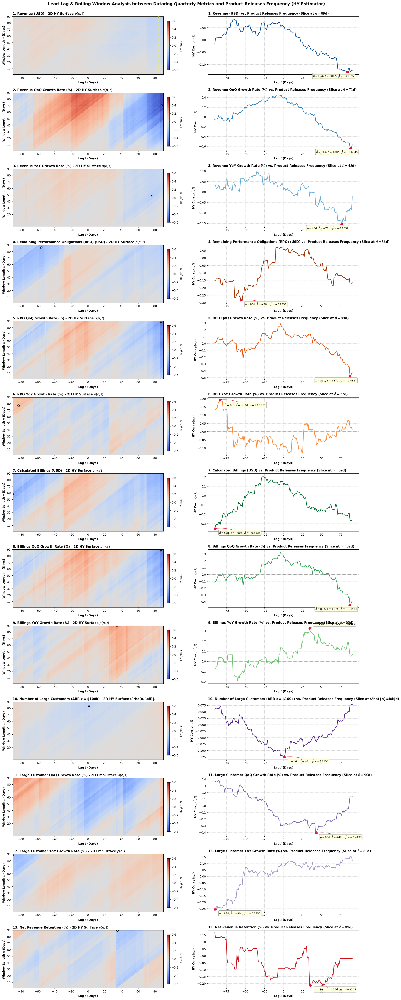

In [28]:
# Create 2D array of alternative data for each n and l, dy_all. 
# Each row contains data for a given n, each column represents the next alternative datapoint
# along the timeline.
rolling_announcements = [s_announcements.resample('D').size().rolling(f'{w}D', min_periods=1).sum() for w in wgrid_days]
t_y_ann, _ = extract_time_and_values(rolling_announcements[0])
dy_all_ann = np.empty((len(wgrid_days), len(t_y_ann) - 1), dtype=np.float64)
for i, s_w in enumerate(rolling_announcements):
    _, v_w = extract_time_and_values(s_w)
    dy_all_ann[i, :] = np.diff(v_w - np.mean(v_w))

fig, axes = plt.subplots(len(metric_configs), 2, figsize=(18, 48), gridspec_kw={'width_ratios': [1.2, 1]})

hy_results_announcements = []

for idx, cfg in enumerate(metric_configs):
    ax_map = axes[idx, 0]
    ax_line = axes[idx, 1]
    col = cfg['col']
    title = cfg['title']
    color = cfg['color']
    
    series = df_metrics[col].dropna()
    t_x, v_x = extract_time_and_values(series)
    dx = np.diff(v_x - np.mean(v_x))
    
    corr_matrix = hy_grid_numba(t_x, dx, t_y_ann, dy_all_ann, lags_s)
    abs_corr = np.abs(corr_matrix)
    best_idx = np.unravel_index(np.nanargmax(abs_corr), corr_matrix.shape)
    w_hat = int(wgrid_days[best_idx[0]])
    l_hat = int(lgrid_days[best_idx[1]])
    rho_hat = corr_matrix[best_idx]
    
    hy_results_announcements.append({
        'col': col,
        'title': title,
        'color': color,
        'n_hat': w_hat,
        'l_hat': l_hat,
        'rho_hat': rho_hat,
        'corr_matrix': corr_matrix
    })
    
    # 2D Heatmap
    extent = [lgrid_days[0], lgrid_days[-1], wgrid_days[0], wgrid_days[-1]]
    im = ax_map.imshow(
        corr_matrix,
        extent=extent,
        origin='lower',
        aspect='auto',
        cmap='coolwarm',
        vmin=-0.6,
        vmax=0.6
    )
    ax_map.scatter(l_hat, w_hat, color='yellow', edgecolor='black', s=80, marker='*', zorder=5)
    ax_map.axhline(w_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.axvline(l_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.set_title(f"{title} - 2D HY Surface $\\rho(n, \\ell)$", fontsize=11, fontweight='bold', loc='left')
    ax_map.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_map.set_ylabel(r'Window Length $n$ (Days)', fontsize=10, fontweight='bold')
    cbar = fig.colorbar(im, ax=ax_map, pad=0.02, shrink=0.85)
    cbar.set_label(r'HY $\rho(n, \ell)$', fontsize=9)
    
    # 1D Slice at optimal window length n_hat
    slice_corrs = corr_matrix[best_idx[0], :]
    ax_line.plot(lgrid_days, slice_corrs, color=color, linewidth=2.0, label=f'HY Corr (at $\\hat{{n}}={w_hat}$d)')
    ax_line.axhline(0, color='gray', linestyle='--', linewidth=0.8, alpha=0.6)
    ax_line.axvline(0, color='gray', linestyle=':', linewidth=0.8, alpha=0.6)
    ax_line.scatter(l_hat, rho_hat, color='crimson', s=50, zorder=5)
    
    x_offset = 15 if l_hat <= 45 else -120
    y_offset = -22 if (l_hat < -30 and rho_hat >= 0) else (12 if rho_hat >= 0 else -18)
    ax_line.annotate(
        rf'$\hat{{n}}={w_hat}\mathrm{{d}},\;\hat{{\ell}}={l_hat:+.0f}\mathrm{{d}},\;\hat{{\rho}}={rho_hat:+.4f}$',
        xy=(l_hat, rho_hat),
        xytext=(x_offset, y_offset),
        textcoords='offset points',
        fontsize=9,
        fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='#ffffdd', alpha=0.85, edgecolor='gray', lw=0.7),
        arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.15', color='crimson', lw=1.0)
    )
    ax_line.set_title(f"{title} vs. Product Releases Frequency (Slice at $\\hat{{n}}={w_hat}$d)", fontsize=11, fontweight='bold', loc='left')
    ax_line.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_line.set_ylabel(r'HY Corr $\rho(\hat{n}, \ell)$', fontsize=10, fontweight='bold')
    ax_line.grid(True, linestyle='--', alpha=0.5)

plt.suptitle("Lead-Lag & Rolling Window Analysis between Datadog Quarterly Metrics and Product Releases Frequency (HY Estimator)", fontsize=14, fontweight='bold', y=0.999)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'lead_lag_analysis_hy_announcements.png', dpi=150, bbox_inches='tight')
plt.show()

### Heatmap summary
Heatmap of ideal rolling window length $\hat{n}$, ideal lag $\hat{\ell}$, and maximum HY estimator across all metric-source combinations.


Format: Window length (n), Lag (l) [HY Correlation rho]
Positive lag means alternative data leads quarterly metric. Negative lag means quarterly metric leads alternative data.


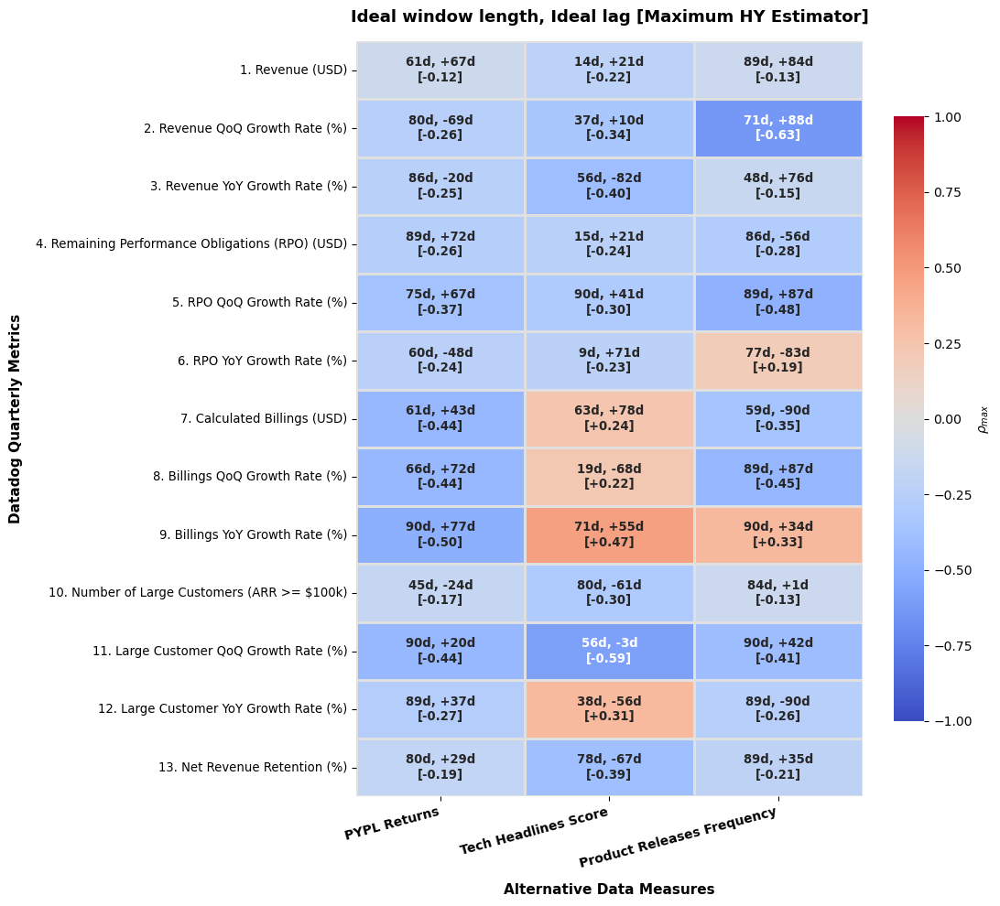

In [29]:
import seaborn as sns

hy_results_all = [
    ('PYPL Returns', hy_results_pypl_returns),
    ('Tech Headlines Score', hy_results_tech_headlines),
    ('Product Releases Frequency', hy_results_announcements)
]

metric_titles = [cfg['title'] for cfg in metric_configs]
alt_titles = [src[0] for src in hy_results_all]

lags_matrix = np.zeros((len(metric_configs), len(hy_results_all)))
windows_matrix = np.zeros((len(metric_configs), len(hy_results_all)))
rhos_matrix = np.zeros((len(metric_configs), len(hy_results_all)))
annot_matrix = np.empty((len(metric_configs), len(hy_results_all)), dtype=object)

for j, (alt_name, res_list) in enumerate(hy_results_all):
    for i, res in enumerate(res_list):
        n_hat = res['n_hat']
        l_hat = res['l_hat']
        rho_hat = res['rho_hat']
        windows_matrix[i, j] = n_hat
        lags_matrix[i, j] = l_hat
        rhos_matrix[i, j] = rho_hat
        annot_matrix[i, j] = f'{n_hat:.0f}d, {l_hat:+.0f}d\n[{rho_hat:+.2f}]'

# Plot heatmap
fig, ax = plt.subplots(figsize=(11, 10))
sns.heatmap(
    rhos_matrix,
    annot=annot_matrix,
    fmt='',
    cmap='coolwarm',
    center=0,
    vmin=-1,
    vmax=1,
    xticklabels=alt_titles,
    yticklabels=metric_titles,
    cbar_kws={'label': r'$\rho_{max}$', 'shrink': 0.8},
    linewidths=1,
    linecolor='#e0e0e0',
    ax=ax,
    annot_kws={'fontsize': 9.5, 'fontweight': 'bold'}
)

ax.set_title('Ideal window length, Ideal lag [Maximum HY Estimator]', fontsize=13, fontweight='bold', pad=15)
ax.set_xlabel('Alternative Data Measures', fontsize=11, fontweight='bold', labelpad=10)
ax.set_ylabel('Datadog Quarterly Metrics', fontsize=11, fontweight='bold', labelpad=10)
plt.xticks(rotation=15, ha='right', fontsize=10, fontweight='semibold')
plt.yticks(fontsize=9.5)
plt.tight_layout()
plt.savefig(SUMMARIES_DIR / 'heatmap_lead_lag.png', dpi=200, bbox_inches='tight')
print("Format: Window length (n), Lag (l) [HY Correlation rho]")
print("Positive lag means alternative data leads quarterly metric. Negative lag means quarterly metric leads alternative data.")
plt.show()

### Save results to CSV

In [30]:
# Create summary dataframe for combinations where alternative data is the leading indicator ie. lag>0
records_hy = []
for alt_name, res_list in hy_results_all:
    for res in res_list:
        records_hy.append({
            'source': alt_name,
            'metric': res['title'][3:].strip(),
            'optimal window': res['n_hat'],
            'optimal lag': res['l_hat'],
            'hy estimator': round(res['rho_hat'], 4)
        })

df_hy_all = pd.DataFrame(records_hy)
df_hy_summary = df_hy_all[df_hy_all['optimal lag'] > 0].reset_index(drop=True)

# Preserve existing ML evaluation results if hy_summary.csv already exists
csv_hy_path = SUMMARIES_DIR / 'hy_summary.csv'
if csv_hy_path.exists():
    df_existing = pd.read_csv(csv_hy_path)
    df_existing['metric'] = df_existing['metric'].astype(str).apply(lambda m: m[3:].strip() if m[:2].rstrip('.').isdigit() else m.strip())
    df_existing['source'] = df_existing['source'].astype(str).str.strip()
    ml_cols = [c for c in ['linr_r2', 'linr_rmse', 'rf_r2', 'rf_rmse'] if c in df_existing.columns]
    if ml_cols:
        df_hy_summary = pd.merge(
            df_hy_summary,
            df_existing[['source', 'metric'] + ml_cols].drop_duplicates(subset=['source', 'metric']),
            on=['source', 'metric'],
            how='left'
        )

# Ensure ML evaluation columns exist
for c in ['linr_r2', 'linr_rmse', 'rf_r2', 'rf_rmse']:
    if c not in df_hy_summary.columns:
        df_hy_summary[c] = np.nan

# Prevent duplication of any row and enforce column order
df_hy_summary = df_hy_summary.drop_duplicates(subset=['source', 'metric']).reset_index(drop=True)
cols_hy = ['source', 'metric', 'optimal window', 'optimal lag', 'hy estimator', 'linr_r2', 'linr_rmse', 'rf_r2', 'rf_rmse']
df_hy_summary = df_hy_summary[cols_hy]

# Save summary to CSV
try:
    df_hy_summary.to_csv(csv_hy_path, index=False)
    print(f"Saved {len(df_hy_summary)} rows to {csv_hy_path}.")
except PermissionError:
    print(f"Note: {csv_hy_path} is locked by another program. Save skipped.")


Saved 25 rows to c:\Users\limli\Documents\Job Applications\Assignments\FUNDA\Code\..\Results\Summaries\hy_summary.csv.


## Lead-Lag Analysis using Pearson's Correlation
We evaluate Pearson's correlation coefficient $r(n, \ell)$ across a 2D parameter grid of rolling average window lengths $n \in [1, 90]$ days and time shifts $\ell \in [-90, +90]$ days. The optimal parameter pair $(\hat{n}, \hat{\ell})$ is obtained via contrast maximization:
$$\hat{n}, \hat{\ell} = \arg\max_{n, \ell} |r(n, \ell)|$$

If **$\hat{\ell} > 0$**, alternative data **lead** the quarterly metric by $\hat{\ell}$ days. If **$\hat{\ell} < 0$**: The quarterly metric **leads** alternative data by $|\hat{\ell}|$ days.

Interpretation of Pearson's correlation:
  - Correlation > 0.7: Strong positive relationship
  - Correlation 0.3-0.7: Moderate relationship
  - Correlation < 0.3: Weak/no relationship


### Source 1: PYPL returns

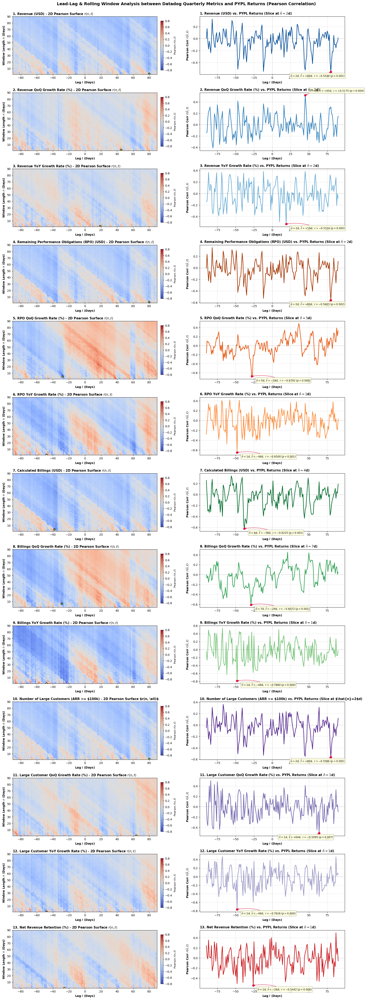

In [31]:
# Create 2D array of alternative data for each n and l, dy_all. 
# Each row contains data for a given n, each column represents the next alternative datapoint
# along the timeline.
t_y_pypl, _ = extract_time_and_values(s_pypl_returns)
v_all_pypl = np.empty((len(wgrid_days), len(t_y_pypl)), dtype=np.float64)
rolling_pypl_list = [s_pypl_returns.rolling(f'{w}D', min_periods=1).mean() for w in wgrid_days]
for i, s_w in enumerate(rolling_pypl_list):
    _, v_w = extract_time_and_values(s_w)
    v_all_pypl[i, :] = v_w

fig, axes = plt.subplots(len(metric_configs), 2, figsize=(18, 48), gridspec_kw={'width_ratios': [1.2, 1]})

pearsons_results_pypl_returns = []

for idx, cfg in enumerate(metric_configs):
    ax_map = axes[idx, 0]
    ax_line = axes[idx, 1]
    col = cfg['col']
    title = cfg['title']
    color = cfg['color']
    
    series = df_metrics[col].dropna()
    t_x, v_x = extract_time_and_values(series)
    
    r_matrix = pearsons_grid_numba(t_y_pypl, v_all_pypl, t_x, v_x, lags_s)
    abs_r = np.abs(r_matrix)
    best_idx = np.unravel_index(np.nanargmax(abs_r), r_matrix.shape)
    w_hat = int(wgrid_days[best_idx[0]])
    l_hat = int(lgrid_days[best_idx[1]])
    r_hat = r_matrix[best_idx]
    
    # Calculate exact p-value at optimal window and lag
    s_opt = rolling_pypl_list[best_idx[0]]
    _, p_hat = pearsons_corr_lag(s_opt, series, l_hat)
    
    pearsons_results_pypl_returns.append({
        'col': col,
        'title': title,
        'color': color,
        'n_hat': w_hat,
        'l_hat': l_hat,
        'r_hat': r_hat,
        'p_value': p_hat,
        'r_matrix': r_matrix
    })
    
    # 2D Heatmap
    extent = [lgrid_days[0], lgrid_days[-1], wgrid_days[0], wgrid_days[-1]]
    im = ax_map.imshow(
        r_matrix,
        extent=extent,
        origin='lower',
        aspect='auto',
        cmap='coolwarm',
        vmin=-0.8,
        vmax=0.8
    )
    ax_map.scatter(l_hat, w_hat, color='yellow', edgecolor='black', s=80, marker='*', zorder=5)
    ax_map.axhline(w_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.axvline(l_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.set_title(f"{title} - 2D Pearson Surface $r(n, \\ell)$", fontsize=11, fontweight='bold', loc='left')
    ax_map.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_map.set_ylabel(r'Window Length $n$ (Days)', fontsize=10, fontweight='bold')
    cbar = fig.colorbar(im, ax=ax_map, pad=0.02, shrink=0.85)
    cbar.set_label(r'Pearson $r(n, \ell)$', fontsize=9)
    
    # 1D Slice at optimal window length n_hat
    slice_corrs = r_matrix[best_idx[0], :]
    ax_line.plot(lgrid_days, slice_corrs, color=color, linewidth=2.0, label=f'Pearson Corr (at $\\hat{{n}}={w_hat}$d)')
    ax_line.axhline(0, color='gray', linestyle='--', linewidth=0.8, alpha=0.6)
    ax_line.axvline(0, color='gray', linestyle=':', linewidth=0.8, alpha=0.6)
    ax_line.scatter(l_hat, r_hat, color='crimson', s=50, zorder=5)
    
    x_offset = 15 if l_hat <= 45 else -140
    y_offset = -22 if (l_hat < -30 and r_hat >= 0) else (12 if r_hat >= 0 else -18)
    ax_line.annotate(
        rf'$\hat{{n}}={w_hat}\mathrm{{d}},\;\hat{{\ell}}={l_hat:+.0f}\mathrm{{d}},\;r={r_hat:+.4f}\;(p={p_hat:.3f})$',
        xy=(l_hat, r_hat),
        xytext=(x_offset, y_offset),
        textcoords='offset points',
        fontsize=9,
        fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='#ffffdd', alpha=0.85, edgecolor='gray', lw=0.7),
        arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.15', color='crimson', lw=1.0)
    )
    ax_line.set_title(f"{title} vs. PYPL Returns (Slice at $\\hat{{n}}={w_hat}$d)", fontsize=11, fontweight='bold', loc='left')
    ax_line.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_line.set_ylabel(r'Pearson Corr $r(\hat{n}, \ell)$', fontsize=10, fontweight='bold')
    ax_line.grid(True, linestyle='--', alpha=0.5)

plt.suptitle("Lead-Lag & Rolling Window Analysis between Datadog Quarterly Metrics and PYPL Returns (Pearson Correlation)", fontsize=14, fontweight='bold', y=0.999)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'lead_lag_analysis_pearsons_pypl_returns.png', dpi=150, bbox_inches='tight')
plt.show()


### Source 2: Tech headlines

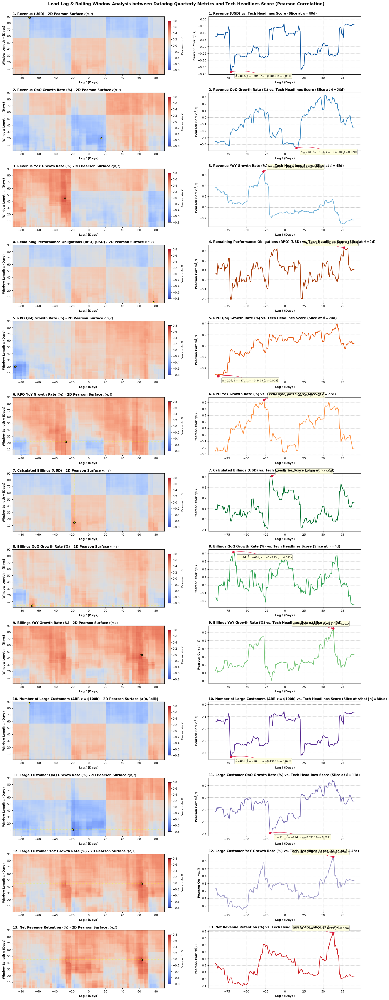

In [32]:
# Create 2D array of alternative data for each n and l, dy_all. 
# Each row contains data for a given n, each column represents the next alternative datapoint
# along the timeline.
t_y_tech, _ = extract_time_and_values(rolling_tech_headlines[0])
v_all_tech = np.empty((len(wgrid_days), len(t_y_tech)), dtype=np.float64)
for i, s_w in enumerate(rolling_tech_headlines):
    _, v_w = extract_time_and_values(s_w)
    v_all_tech[i, :] = v_w

fig, axes = plt.subplots(len(metric_configs), 2, figsize=(18, 48), gridspec_kw={'width_ratios': [1.2, 1]})

pearsons_results_tech_headlines = []

for idx, cfg in enumerate(metric_configs):
    ax_map = axes[idx, 0]
    ax_line = axes[idx, 1]
    col = cfg['col']
    title = cfg['title']
    color = cfg['color']
    
    series = df_metrics[col].dropna()
    t_x, v_x = extract_time_and_values(series)
    
    r_matrix = pearsons_grid_numba(t_y_tech, v_all_tech, t_x, v_x, lags_s)
    abs_r = np.abs(r_matrix)
    best_idx = np.unravel_index(np.nanargmax(abs_r), r_matrix.shape)
    w_hat = int(wgrid_days[best_idx[0]])
    l_hat = int(lgrid_days[best_idx[1]])
    r_hat = r_matrix[best_idx]
    
    # Calculate exact p-value at optimal window and lag
    s_opt = rolling_tech_headlines[best_idx[0]]
    _, p_hat = pearsons_corr_lag(s_opt, series, l_hat)
    
    pearsons_results_tech_headlines.append({
        'col': col,
        'title': title,
        'color': color,
        'n_hat': w_hat,
        'l_hat': l_hat,
        'r_hat': r_hat,
        'p_value': p_hat,
        'r_matrix': r_matrix
    })
    
    # 2D Heatmap
    extent = [lgrid_days[0], lgrid_days[-1], wgrid_days[0], wgrid_days[-1]]
    im = ax_map.imshow(
        r_matrix,
        extent=extent,
        origin='lower',
        aspect='auto',
        cmap='coolwarm',
        vmin=-0.8,
        vmax=0.8
    )
    ax_map.scatter(l_hat, w_hat, color='yellow', edgecolor='black', s=80, marker='*', zorder=5)
    ax_map.axhline(w_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.axvline(l_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.set_title(f"{title} - 2D Pearson Surface $r(n, \\ell)$", fontsize=11, fontweight='bold', loc='left')
    ax_map.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_map.set_ylabel(r'Window Length $n$ (Days)', fontsize=10, fontweight='bold')
    cbar = fig.colorbar(im, ax=ax_map, pad=0.02, shrink=0.85)
    cbar.set_label(r'Pearson $r(n, \ell)$', fontsize=9)
    
    # 1D Slice at optimal window length n_hat
    slice_corrs = r_matrix[best_idx[0], :]
    ax_line.plot(lgrid_days, slice_corrs, color=color, linewidth=2.0, label=f'Pearson Corr (at $\\hat{{n}}={w_hat}$d)')
    ax_line.axhline(0, color='gray', linestyle='--', linewidth=0.8, alpha=0.6)
    ax_line.axvline(0, color='gray', linestyle=':', linewidth=0.8, alpha=0.6)
    ax_line.scatter(l_hat, r_hat, color='crimson', s=50, zorder=5)
    
    x_offset = 15 if l_hat <= 45 else -140
    y_offset = -22 if (l_hat < -30 and r_hat >= 0) else (12 if r_hat >= 0 else -18)
    ax_line.annotate(
        rf'$\hat{{n}}={w_hat}\mathrm{{d}},\;\hat{{\ell}}={l_hat:+.0f}\mathrm{{d}},\;r={r_hat:+.4f}\;(p={p_hat:.3f})$',
        xy=(l_hat, r_hat),
        xytext=(x_offset, y_offset),
        textcoords='offset points',
        fontsize=9,
        fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='#ffffdd', alpha=0.85, edgecolor='gray', lw=0.7),
        arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.15', color='crimson', lw=1.0)
    )
    ax_line.set_title(f"{title} vs. Tech Headlines Score (Slice at $\\hat{{n}}={w_hat}$d)", fontsize=11, fontweight='bold', loc='left')
    ax_line.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_line.set_ylabel(r'Pearson Corr $r(\hat{n}, \ell)$', fontsize=10, fontweight='bold')
    ax_line.grid(True, linestyle='--', alpha=0.5)

plt.suptitle("Lead-Lag & Rolling Window Analysis between Datadog Quarterly Metrics and Tech Headlines Score (Pearson Correlation)", fontsize=14, fontweight='bold', y=0.999)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'lead_lag_analysis_pearsons_tech_headlines.png', dpi=150, bbox_inches='tight')
plt.show()


### Source 3: Datadog product releases

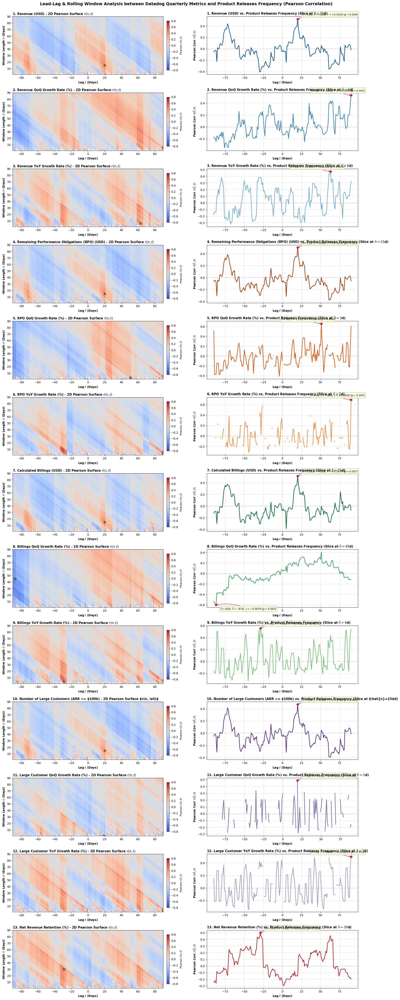

In [33]:
# Create 2D array of alternative data for each n and l, dy_all. 
# Each row contains data for a given n, each column represents the next alternative datapoint
# along the timeline.
t_y_ann, _ = extract_time_and_values(rolling_announcements[0])
v_all_ann = np.empty((len(wgrid_days), len(t_y_ann)), dtype=np.float64)
for i, s_w in enumerate(rolling_announcements):
    _, v_w = extract_time_and_values(s_w)
    v_all_ann[i, :] = v_w

fig, axes = plt.subplots(len(metric_configs), 2, figsize=(18, 48), gridspec_kw={'width_ratios': [1.2, 1]})

pearsons_results_announcements = []

for idx, cfg in enumerate(metric_configs):
    ax_map = axes[idx, 0]
    ax_line = axes[idx, 1]
    col = cfg['col']
    title = cfg['title']
    color = cfg['color']
    
    series = df_metrics[col].dropna()
    t_x, v_x = extract_time_and_values(series)
    
    r_matrix = pearsons_grid_numba(t_y_ann, v_all_ann, t_x, v_x, lags_s)
    abs_r = np.abs(r_matrix)
    best_idx = np.unravel_index(np.nanargmax(abs_r), r_matrix.shape)
    w_hat = int(wgrid_days[best_idx[0]])
    l_hat = int(lgrid_days[best_idx[1]])
    r_hat = r_matrix[best_idx]
    
    # Calculate exact p-value at optimal window and lag
    s_opt = rolling_announcements[best_idx[0]]
    _, p_hat = pearsons_corr_lag(s_opt, series, l_hat)
    
    pearsons_results_announcements.append({
        'col': col,
        'title': title,
        'color': color,
        'n_hat': w_hat,
        'l_hat': l_hat,
        'r_hat': r_hat,
        'p_value': p_hat,
        'r_matrix': r_matrix
    })
    
    # 2D Heatmap
    extent = [lgrid_days[0], lgrid_days[-1], wgrid_days[0], wgrid_days[-1]]
    im = ax_map.imshow(
        r_matrix,
        extent=extent,
        origin='lower',
        aspect='auto',
        cmap='coolwarm',
        vmin=-0.8,
        vmax=0.8
    )
    ax_map.scatter(l_hat, w_hat, color='yellow', edgecolor='black', s=80, marker='*', zorder=5)
    ax_map.axhline(w_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.axvline(l_hat, color='yellow', linestyle=':', alpha=0.5, linewidth=1)
    ax_map.set_title(f"{title} - 2D Pearson Surface $r(n, \\ell)$", fontsize=11, fontweight='bold', loc='left')
    ax_map.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_map.set_ylabel(r'Window Length $n$ (Days)', fontsize=10, fontweight='bold')
    cbar = fig.colorbar(im, ax=ax_map, pad=0.02, shrink=0.85)
    cbar.set_label(r'Pearson $r(n, \ell)$', fontsize=9)
    
    # 1D Slice at optimal window length n_hat
    slice_corrs = r_matrix[best_idx[0], :]
    ax_line.plot(lgrid_days, slice_corrs, color=color, linewidth=2.0, label=f'Pearson Corr (at $\\hat{{n}}={w_hat}$d)')
    ax_line.axhline(0, color='gray', linestyle='--', linewidth=0.8, alpha=0.6)
    ax_line.axvline(0, color='gray', linestyle=':', linewidth=0.8, alpha=0.6)
    ax_line.scatter(l_hat, r_hat, color='crimson', s=50, zorder=5)
    
    x_offset = 15 if l_hat <= 45 else -140
    y_offset = -22 if (l_hat < -30 and r_hat >= 0) else (12 if r_hat >= 0 else -18)
    ax_line.annotate(
        rf'$\hat{{n}}={w_hat}\mathrm{{d}},\;\hat{{\ell}}={l_hat:+.0f}\mathrm{{d}},\;r={r_hat:+.4f}\;(p={p_hat:.3f})$',
        xy=(l_hat, r_hat),
        xytext=(x_offset, y_offset),
        textcoords='offset points',
        fontsize=9,
        fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.25', facecolor='#ffffdd', alpha=0.85, edgecolor='gray', lw=0.7),
        arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.15', color='crimson', lw=1.0)
    )
    ax_line.set_title(f"{title} vs. Product Releases Frequency (Slice at $\\hat{{n}}={w_hat}$d)", fontsize=11, fontweight='bold', loc='left')
    ax_line.set_xlabel(r'Lag $\ell$ (Days)', fontsize=10, fontweight='bold')
    ax_line.set_ylabel(r'Pearson Corr $r(\hat{n}, \ell)$', fontsize=10, fontweight='bold')
    ax_line.grid(True, linestyle='--', alpha=0.5)

plt.suptitle("Lead-Lag & Rolling Window Analysis between Datadog Quarterly Metrics and Product Releases Frequency (Pearson Correlation)", fontsize=14, fontweight='bold', y=0.999)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'lead_lag_analysis_pearsons_announcements.png', dpi=150, bbox_inches='tight')
plt.show()


### Save results to CSV

In [34]:
# Create summary DataFrame
pearsons_results_all = [
    ('PYPL Returns', pearsons_results_pypl_returns),
    ('Tech Headlines Score', pearsons_results_tech_headlines),
    ('Product Releases Frequency', pearsons_results_announcements)
]

records_pearson = []
for alt_name, results_list in pearsons_results_all:
    for res in results_list:
        p_val = res['p_value']
        records_pearson.append({
            'source': alt_name,
            'metric': res['title'][3:].strip(),
            'optimal window': res['n_hat'],
            'optimal lag': res['l_hat'],
            'pearsons coeff': round(res['r_hat'], 4),
            'p-value': f"{p_val:.4e}" if p_val < 0.001 else f"{p_val:.4f}",
            'significant (p<0.05)': True if p_val < 0.05 else False
        })

df_pearsons_all = pd.DataFrame(records_pearson)
df_pearsons_summary = df_pearsons_all[df_pearsons_all['optimal lag'] > 0].reset_index(drop=True)

# Preserve existing ML evaluation results if pearsons_summary.csv already exists
csv_p_path = SUMMARIES_DIR / 'pearsons_summary.csv'
if csv_p_path.exists():
    df_existing = pd.read_csv(csv_p_path)
    df_existing['metric'] = df_existing['metric'].astype(str).apply(lambda m: m[3:].strip() if m[:2].rstrip('.').isdigit() else m.strip())
    df_existing['source'] = df_existing['source'].astype(str).str.strip()
    ml_cols = [c for c in ['linr_r2', 'linr_rmse', 'rf_r2', 'rf_rmse'] if c in df_existing.columns]
    if ml_cols:
        df_pearsons_summary = pd.merge(
            df_pearsons_summary,
            df_existing[['source', 'metric'] + ml_cols].drop_duplicates(subset=['source', 'metric']),
            on=['source', 'metric'],
            how='left'
        )

# Ensure ML evaluation columns exist
for c in ['linr_r2', 'linr_rmse', 'rf_r2', 'rf_rmse']:
    if c not in df_pearsons_summary.columns:
        df_pearsons_summary[c] = np.nan

# Prevent duplication of any row and enforce column order
df_pearsons_summary = df_pearsons_summary.drop_duplicates(subset=['source', 'metric']).reset_index(drop=True)
cols_p = ['source', 'metric', 'optimal window', 'optimal lag', 'pearsons coeff', 'p-value', 'significant (p<0.05)', 'linr_r2', 'linr_rmse', 'rf_r2', 'rf_rmse']
df_pearsons_summary = df_pearsons_summary[cols_p]

# Save summary to CSV
try:
    df_pearsons_summary.to_csv(csv_p_path, index=False)
    print(f"Saved {len(df_pearsons_summary)} rows to {csv_p_path}.")
except PermissionError:
    print(f"Note: {csv_p_path} is locked by another program. Save skipped.")


Saved 21 rows to c:\Users\limli\Documents\Job Applications\Assignments\FUNDA\Code\..\Results\Summaries\pearsons_summary.csv.


### Heatmap summary

Format: Window length (n), Lag (l) [Pearson Correlation r]
Positive lag means alternative data leads quarterly metric. Negative lag means quarterly metric leads alternative data.


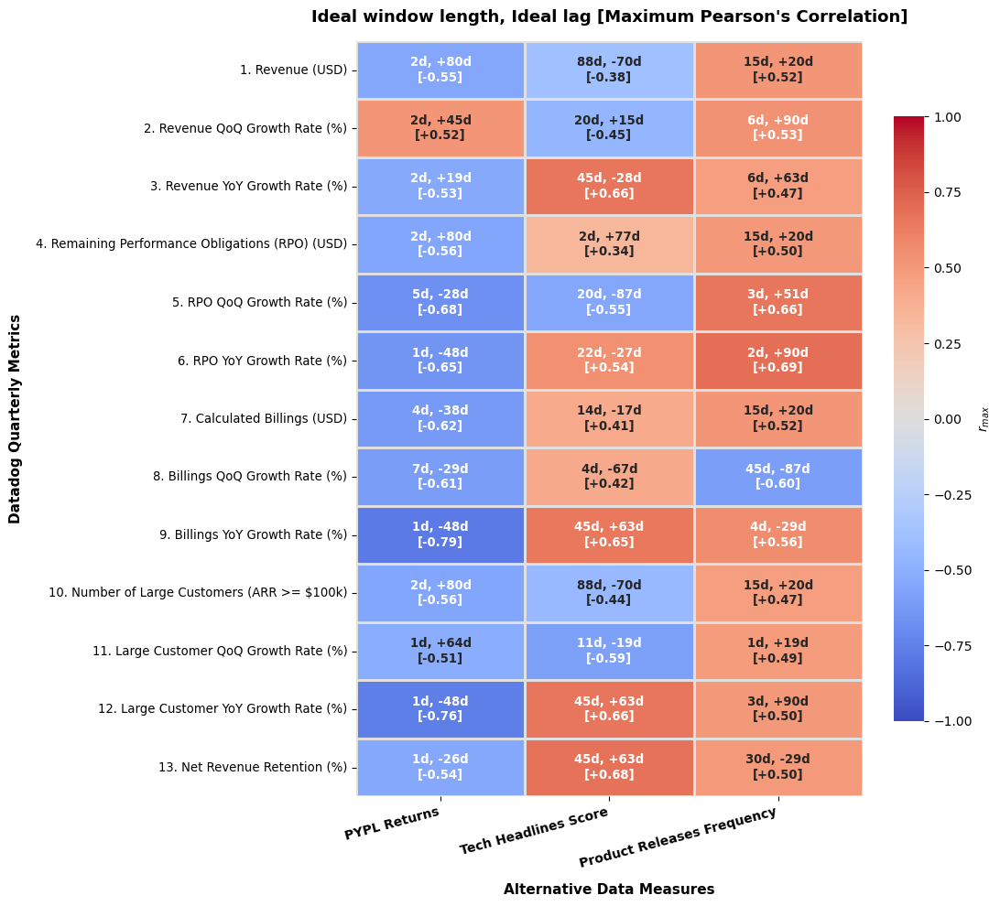

In [35]:
import seaborn as sns

lags_matrix_p = np.zeros((len(metric_configs), len(pearsons_results_all)))
windows_matrix_p = np.zeros((len(metric_configs), len(pearsons_results_all)))
rhos_matrix_p = np.zeros((len(metric_configs), len(pearsons_results_all)))
annot_matrix_p = np.empty((len(metric_configs), len(pearsons_results_all)), dtype=object)

for j, (alt_name, res_list) in enumerate(pearsons_results_all):
    for i, res in enumerate(res_list):
        n_hat = res['n_hat']
        l_hat = res['l_hat']
        r_hat = res['r_hat']
        windows_matrix_p[i, j] = n_hat
        lags_matrix_p[i, j] = l_hat
        rhos_matrix_p[i, j] = r_hat
        annot_matrix_p[i, j] = f'{n_hat:.0f}d, {l_hat:+.0f}d\n[{r_hat:+.2f}]'

# Plot heatmap
fig, ax = plt.subplots(figsize=(11, 10))
sns.heatmap(
    rhos_matrix_p,
    annot=annot_matrix_p,
    fmt='',
    cmap='coolwarm',
    center=0,
    vmin=-1,
    vmax=1,
    xticklabels=[item[0] for item in pearsons_results_all],
    yticklabels=[cfg['title'] for cfg in metric_configs],
    cbar_kws={'label': r'$r_{max}$', 'shrink': 0.8},
    linewidths=1,
    linecolor='#e0e0e0',
    ax=ax,
    annot_kws={'fontsize': 9.5, 'fontweight': 'bold'}
)

ax.set_title("Ideal window length, Ideal lag [Maximum Pearson's Correlation]", fontsize=13, fontweight='bold', pad=15)
ax.set_xlabel('Alternative Data Measures', fontsize=11, fontweight='bold', labelpad=10)
ax.set_ylabel('Datadog Quarterly Metrics', fontsize=11, fontweight='bold', labelpad=10)
plt.xticks(rotation=15, ha='right', fontsize=10, fontweight='semibold')
plt.yticks(fontsize=9.5)
plt.tight_layout()
plt.savefig(SUMMARIES_DIR / 'heatmap_lead_lag_pearsons.png', dpi=200, bbox_inches='tight')
print("Format: Window length (n), Lag (l) [Pearson Correlation r]")
print("Positive lag means alternative data leads quarterly metric. Negative lag means quarterly metric leads alternative data.")
plt.show()
